## Introduction

The dataset consists information of 5000 movies with their genres, budget, revenue, production company, revenue, user-rating , vote-count and popularity as the primary fields. It also has the detailed information of cast and crew.

In [1]:
from IPython.core.display import HTML
HTML("""
<style>

div.cell { /* Tunes the space between cells */
margin-top:1em;
margin-bottom:1em;
}

div.text_cell_render h1 { /* Main titles bigger, centered */
font-size: 2.2em;
line-height:1.4em;
text-align:center;
}

div.text_cell_render h2 { /*  Parts names nearer from text */
margin-bottom: -0.4em;
}


div.text_cell_render { /* Customize text cells */
font-family: 'Times New Roman';
font-size:1.5em;
line-height:1.4em;
padding-left:3em;
padding-right:3em;
}
</style>
""")

In [2]:
# import modules
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import json
import cufflinks as cf
import seaborn as sns
import plotly.graph_objs as go
import plotly
from wordcloud import WordCloud
plotly.offline.init_notebook_mode()
sns.set(style="whitegrid")
cf.set_config_file(world_readable=True,offline=True)

In [3]:
movies = pd.read_csv("../DataSets/tmdb-5000-movie-dataset/tmdb_5000_movies.csv")
credits = pd.read_csv("../DataSets/tmdb-5000-movie-dataset/tmdb_5000_credits.csv")

In [4]:
movies.head()

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.sonypictures.com/movies/spectre/,206647,"[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,880674609,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466
3,250000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...",http://www.thedarkknightrises.com/,49026,"[{""id"": 849, ""name"": ""dc comics""}, {""id"": 853,...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-07-16,1084939099,165.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,The Legend Ends,The Dark Knight Rises,7.6,9106
4,260000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://movies.disney.com/john-carter,49529,"[{""id"": 818, ""name"": ""based on novel""}, {""id"":...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-03-07,284139100,132.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"Lost in our world, found in another.",John Carter,6.1,2124


In [5]:
credits.head()

,movie_id,title,cast,crew
0,19995,Avatar,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."
1,285,Pirates of the Caribbean: At World's End,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de..."
2,206647,Spectre,"[{""cast_id"": 1, ""character"": ""James Bond"", ""cr...","[{""credit_id"": ""54805967c3a36829b5002c41"", ""de..."
3,49026,The Dark Knight Rises,"[{""cast_id"": 2, ""character"": ""Bruce Wayne / Ba...","[{""credit_id"": ""52fe4781c3a36847f81398c3"", ""de..."
4,49529,John Carter,"[{""cast_id"": 5, ""character"": ""John Carter"", ""c...","[{""credit_id"": ""52fe479ac3a36847f813eaa3"", ""de..."


As we don't have the knowledge about the sanctity of dataset, we need to do some primary analysis. At first we need to check that whether the primary key (id) holds it propert or not. The first five results below shows the primary key is unique and the two tables can be joined based on that.


Furthermore we can check that whether any of the columns has missing values or not. From the analysis, it occurs to be the case that 3091 movies out of 4803 has missing homepage, 3 has missing overview, 1 has missing release_date, 2 has missing runtime and 844 has missing tagline. All the movies have corresponding credit information for them.

In [6]:
print("Shape of movies: " + str(movies.shape))
print("Shape of credits: " + str(credits.shape))
print("Unique value of ids in movies: " + str(movies.id.unique().size))
print("Unique value of ids in credits: " + str(credits.movie_id.unique().size))
print("Inner join results size: " + str(pd.merge(movies, credits, left_on='id', right_on='movie_id', how='inner').shape))
# Count of null values in each column of movies
s = movies.isnull().sum()
s = s[s != 0].to_frame()
display(s) 
# Count of null values in each column of credits
s = credits.isnull().sum()
s = s[s != 0].to_frame()
display(s) 

Shape of movies: (4803, 20)
Shape of credits: (4803, 4)
Unique value of ids in movies: 4803
Unique value of ids in credits: 4803
Inner join results size: (4803, 24)


,0
homepage,3091
overview,3
release_date,1
runtime,2
tagline,844


,0


First of all, we can analyse the data based on the release_date. For this we need to transform release_date from string to datetime format and later on extract year, month and day as separate columns.

The first plot the distribution of count of movies and the corresponding count of movies having homepage. It can be presumed that movies having release dates prior to the widespread use of internet will not have the webpage. The plot somehow confirms the claim. It can be seen that for the movies releasaed after 2000, the percentage of movies having a webpage increases exponentially (with a deep slump in 2016!!!!).

Several other interesting insights can be gained by analysing Movie Run Time, Average Vote, Vote Count, Budget/Revenue and Popularity vs Year. Movie Run Time gradually decreases by year of release. Vote Count gradually increases and average vote decreases(this is interesting though!!!! Does this mean that though count of movies made increases by the year but the average quality of the movies detoriarate) by year. Average budget of movies and total revenue increase as well as we advance in time. Another interesting insight is the relationship of revenue with the release month of the movie. It is noted that movies released around May, June and around end of the year collects revenue compared to the one released in rest of the months (It seems that Monthly Box Offide Reports confirms this!!!!).

In [7]:
# Convert release_date from string to datetime and extract year month and date values
movies['release_date'] = pd.to_datetime(movies['release_date'])
movies['release_year'] = movies['release_date'].dt.year
movies['release_month'] = movies['release_date'].dt.month
movies['release_day'] = movies['release_date'].dt.day

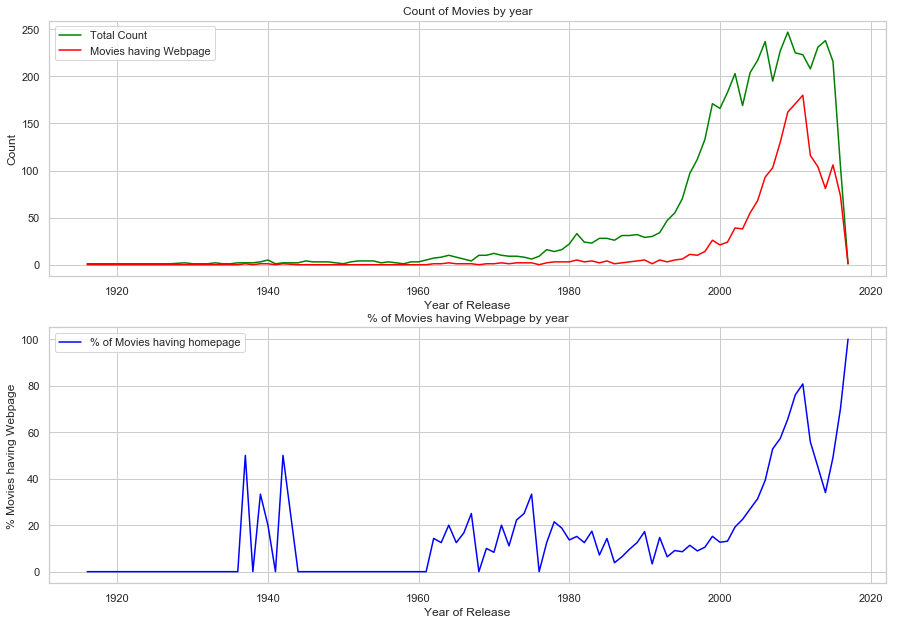

In [8]:
df = pd.DataFrame(data = {
    'movie_count': movies.groupby(['release_year'])['id'].count(),
    'movie_having_homepage': movies.groupby(['release_year'])['homepage'].count(),
    'per_hvng_homepage': (movies.groupby(['release_year'])['homepage'].count()/ movies.groupby(['release_year'])['id'].count())*100
})
# Create a Figure
fig = plt.figure(figsize=(15,16))
# Set up Axes
ax1 = fig.add_subplot(311)
ax1.plot(df.index, df['movie_count'] , 'green', label='Total Count')
ax1.plot(df.index, df['movie_having_homepage'], 'red', label='Movies having Webpage')
ax1.set_xlabel('Year of Release')
ax1.set_ylabel('Count')
ax1.set_title('Count of Movies by year')
ax1.legend()


ax2 = fig.add_subplot(312)
ax2.plot(df.index, df['per_hvng_homepage'] , 'blue', label='% of Movies having homepage')
ax2.set_xlabel('Year of Release')
ax2.set_ylabel('% Movies having Webpage')
ax2.set_title('% of Movies having Webpage by year')
ax2.legend()

plt.show()

Text(0.5,0.98,'Vote Count vs Year')

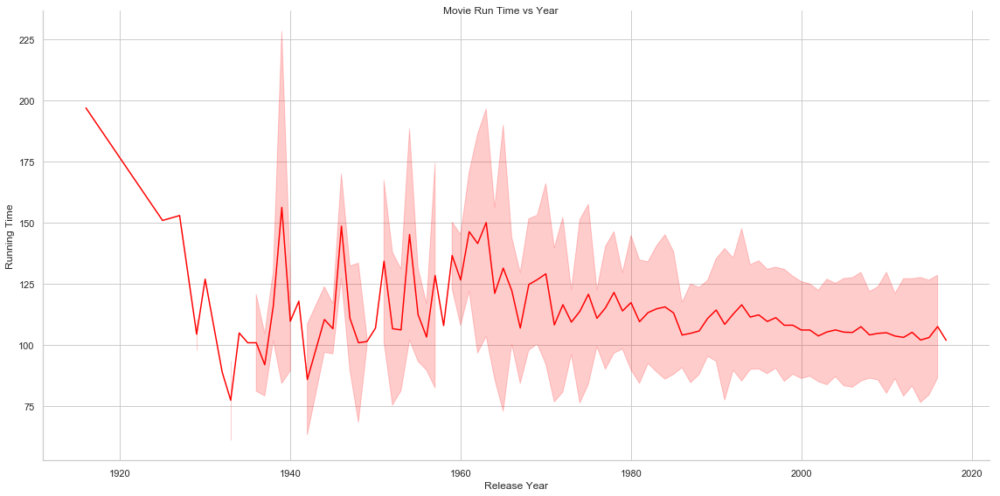

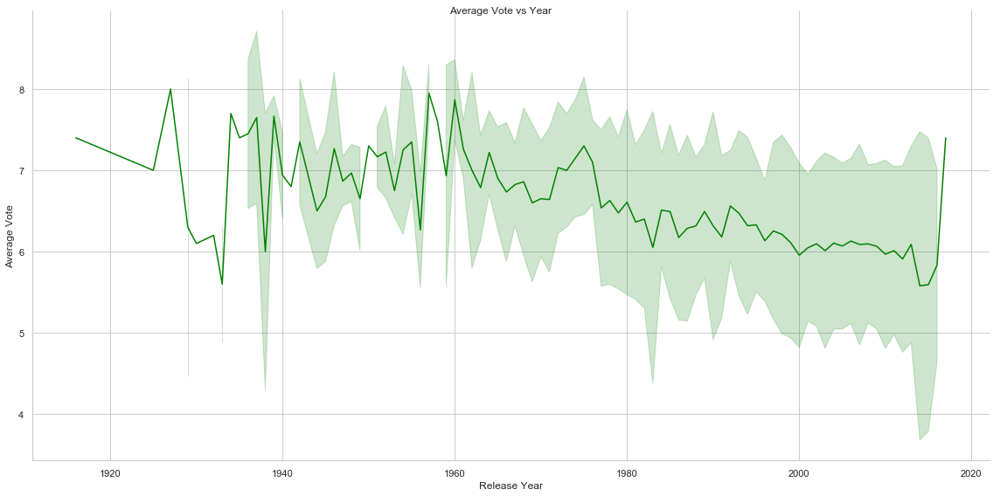

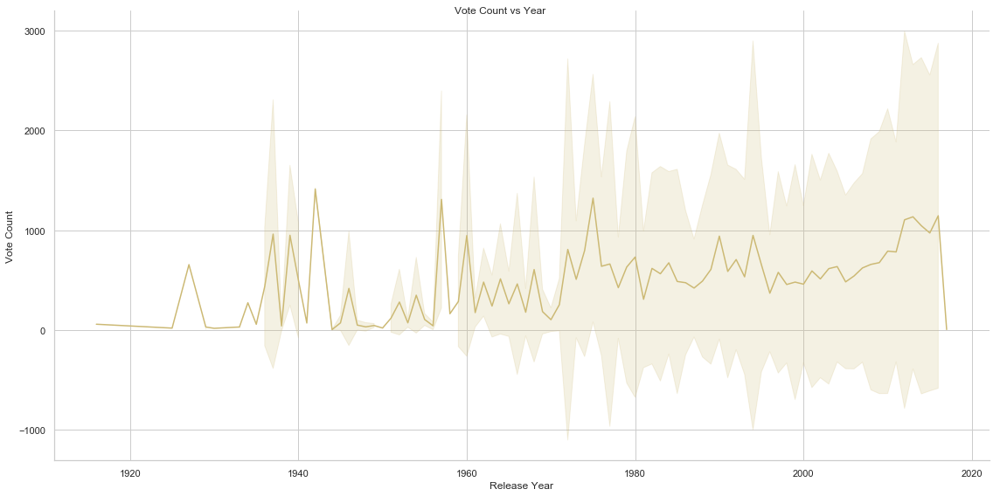

In [9]:
# Plot of Movie Run Time against Year (with Mean and Standard Deviation)
g = sns.relplot(x="release_year", y="runtime", kind="line", ci="sd", data=movies, height=8, aspect=2/1, color="red")
g = g.set_axis_labels("Release Year", "Running Time")
g.fig.suptitle('Movie Run Time vs Year')

# Plot of Average Vote against Year (with Mean and Standard Deviation)
g = sns.relplot(x="release_year", y="vote_average", kind="line", ci="sd", data=movies, height=8, aspect=2/1, color="green")
g = g.set_axis_labels("Release Year", "Average Vote")
g.fig.suptitle('Average Vote vs Year')

# Plot of Vote Count against Year (with Mean and Standard Deviation)
g = sns.relplot(x="release_year", y="vote_count", kind="line", ci="sd", data=movies, height=8, aspect=2/1, color="y")
g = g.set_axis_labels("Release Year", "Vote Count")
g.fig.suptitle('Vote Count vs Year')

Text(0.5,1,'Budget/Revenue vs Year')

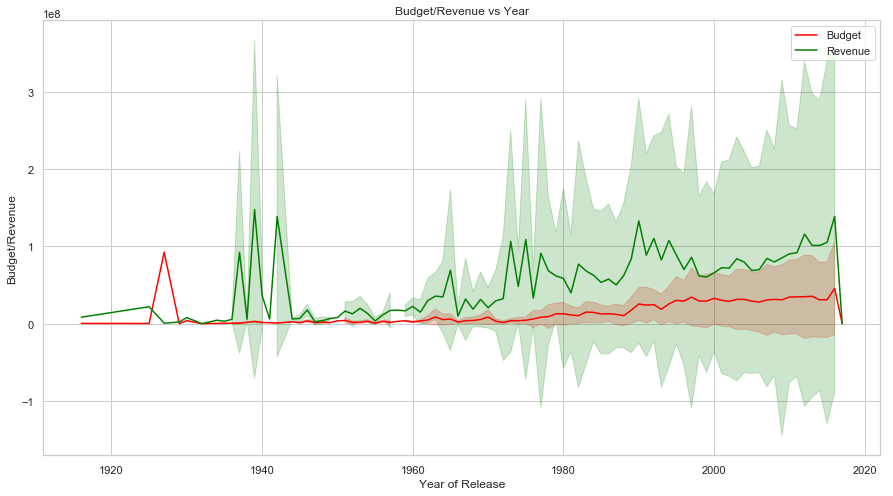

In [10]:
# Plot of mean of budget and revenue vs Year
# Create a Figure
fig = plt.figure(figsize=(15,8))
# Set up Axes
ax = fig.add_subplot(111)
sns.lineplot(x="release_year", y="budget", ci="sd", data=movies, color="red", ax=ax, label="Budget")
sns.lineplot(x="release_year", y="revenue", ci="sd", data=movies, color="green", ax=ax, label="Revenue")
ax.set_xlabel('Year of Release')
ax.set_ylabel('Budget/Revenue')
ax.set_title('Budget/Revenue vs Year')


Text(0.5,0.98,'Popularity vs Year')

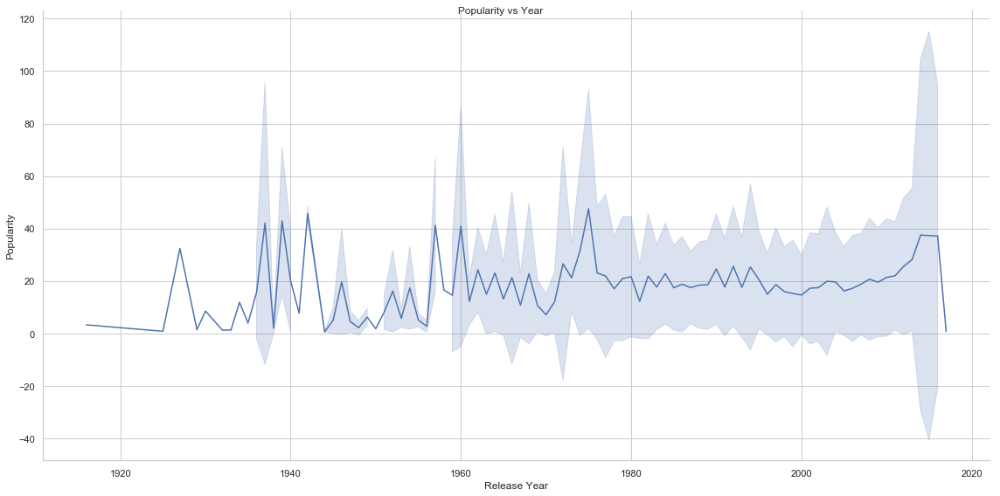

In [11]:
# Plot of mean of popularity vs Year
g = sns.relplot(x="release_year", y="popularity", kind="line", ci="sd", data=movies, height=8, aspect=2/1, color="b")
g = g.set_axis_labels("Release Year", "Popularity")
g.fig.suptitle('Popularity vs Year')

Text(0.5,0.98,'Revenue (with 95% CI) vs Release Month')

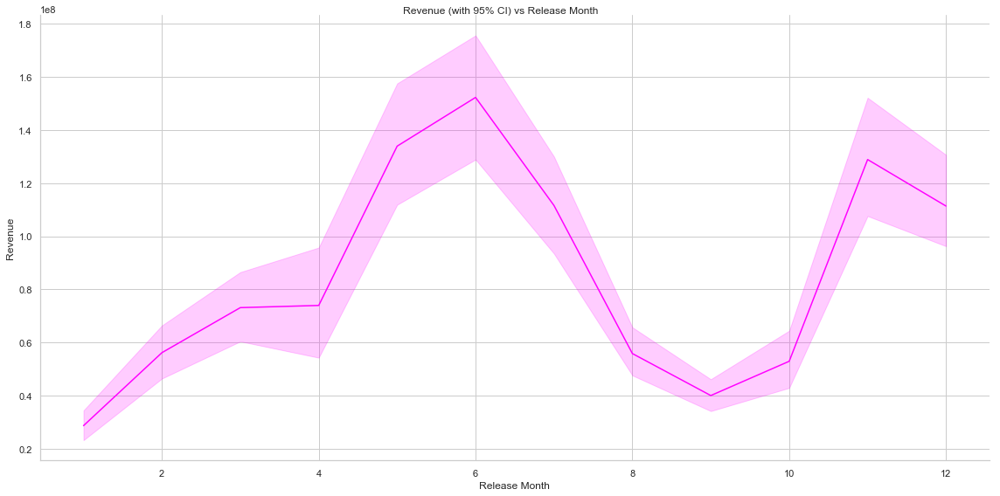

In [12]:
# Plot of Revenue against Month of Release (with Mean and Standard Deviation)
g = sns.relplot(x="release_month", y="revenue", kind="line", data=movies, height=8, aspect=2/1, color="#FF00FF")
g = g.set_axis_labels("Release Month", "Revenue")
g.fig.suptitle('Revenue (with 95% CI) vs Release Month')

We need to do further data cleaning. Five columns named : 'genres', 'keywords', 'production_companies', 'spoken_languages' and 'production_countries' are in JSON (string) format. We need to extract the corresponding values for them and assign them to the movies. From further analysis it was found that total counts of different genres, production_companies, spoken_languages and production_countries are within a certain limit and hence we can maintain a separate data frame which corrsponds individual movies to their respective values for them.

Total count of distinct keywords are considerable and hence they are flattened and delimited by pipe(|) and stored in place.

In [13]:
# Convert columns with json format to dict
json_columns = ['genres', 'keywords', 'production_companies', 'spoken_languages', 'production_countries']
for column in json_columns:
        movies[column] = movies[column].apply(json.loads)

In [14]:
# Code to generate separate data frames for movie_genres, movie_prouction_companies and movie_spoken_language and
# movie_production_countries
# Genres
dict_genres = {}
columns = ['id', 'genre_id']
df_movie_genres = pd.DataFrame(columns=columns)

# Production Companies
dict_production_companies = {}
columns = ['id', 'production_company_id']
df_movie_production_companies = pd.DataFrame(columns=columns)

# Spoken Language
dict_spoken_languages = {}
columns = ['id', 'language_id']
df_movie_languages = pd.DataFrame(columns=columns)

# production_countries
dict_production_countries = {}
columns = ['id', 'production_country_id']
df_movie_production_countries = pd.DataFrame(columns=columns)


for index, row in movies.iterrows():
    for d in row['genres']:
        dict_genres[d.get('id')] = d.get('name')
        df_movie_genres.loc[len(df_movie_genres)] = [row['id'], d.get('id')]
    for d in row['production_companies']:
        dict_production_companies[d.get('id')] = d.get('name')
        df_movie_production_companies.loc[len(df_movie_production_companies)] = [row['id'], d.get('id')]
    for d in row['spoken_languages']:
        dict_spoken_languages[d.get('iso_639_1')] = d.get('name')
        df_movie_languages.loc[len(df_movie_languages)] = [row['id'], d.get('iso_639_1')]
    for d in row['production_countries']:
        dict_production_countries[d.get('iso_3166_1')] = d.get('name')
        df_movie_production_countries.loc[len(df_movie_production_countries)] = [row['id'], d.get('iso_3166_1')]

        
df_genres = pd.DataFrame(list(dict_genres.items()), columns=['id', 'name']);
df_production_companies = pd.DataFrame(list(dict_production_companies.items()), columns=['id', 'name']);
df_spoken_languages = pd.DataFrame(list(dict_spoken_languages.items()), columns=['id', 'name']);
df_production_countries = pd.DataFrame(list(dict_production_countries.items()), columns=['id', 'name']);

In [15]:
# Flatten keywords (separated by pipe)
def flatten_keywords(keyword):
    result = ""
    for x in keyword:
        result += ((x.get('name')) + "|")
    return result
        
movies['keywords'] = movies['keywords'].apply(flatten_keywords)

The dataset can be analysed based on Genre, Language and Production House as well. The pie chart based on Genres and Movie Language is shown below. Drama, Comdy, Thriller and Action are the top 4 movie genres by count. The dataset has the highest number of movies in English followed by French and Spanish. Top 3 production houses based on movie count are: Warner Bros., Universal Pictures and Paramount Pictures.

Historical and War movies have the highest average rating followed by Drama and Musical movies. Warner Bros., Universal Pictures and Paramount Pictures are the top production houses based on average rating as well.

In [16]:
# Movies by genre
s = df_movie_genres.groupby(['genre_id'])['id'].count()
df = pd.DataFrame({'genre_id':s.index, 'count':s.values})
df = pd.merge(df, df_genres, left_on='genre_id', right_on='id', how='inner').drop(['genre_id', 'id'], axis=1)
df.iplot(kind='pie',labels='name',values='count', colorscale='YlOrRd', title='Movies by Genres')

In [17]:
# Movies by language (at least 100 movies for individual languages)
s = df_movie_languages.groupby(['language_id'])['id'].count()
df = pd.DataFrame({'language_id':s.index, 'count':s.values})
df = df[df['count'] >= 100]
df.head(100)
df = pd.merge(df, df_spoken_languages, left_on='language_id', right_on='id', how='inner').drop(['language_id', 'id'], axis=1)
df.iplot(kind='pie',labels='name',values='count', colorscale='YlOrRd', title='Movies by Language(at least 100)')

In [18]:
# Movies by production house (at least 50 movies by the production house)
s = df_movie_production_companies.groupby(['production_company_id'])['id'].count()
df = pd.DataFrame({'production_company_id':s.index, 'count':s.values})
df = df[df['count'] >= 50]
df.head(100)
df = pd.merge(df, df_production_companies, left_on='production_company_id', right_on='id', how='inner').drop(['production_company_id', 'id'], axis=1)
df.iplot(kind='pie',labels='name',values='count', colorscale='YlOrRd', title='Movies by Production House(at least 50)')

In [19]:
# Average Rating by Genre
df_movie_genres['id'] = df_movie_genres['id'].astype(int)
df = pd.merge(df_movie_genres, movies, left_on='id', right_on='id', how='left')[['id', 'genre_id', 'vote_average']]
s = df.groupby(['genre_id'])['vote_average'].mean()
df = pd.DataFrame({'genre_id':s.index, 'average_vote':s.values})
df = pd.merge(df, df_genres, left_on='genre_id', right_on='id', how='inner').drop(['genre_id', 'id'], axis=1)

# Plot bargraph
# create trace
trace = go.Bar(
                x = df['name'],
                y = df['average_vote'],
                marker = dict(color = '#D2B4DE',
                             line=dict(color='rgb(0,0,0)',width=1.5)),
                text = df['name'])
data = [trace]
layout = go.Layout(
    title = 'Average Rating by Genre',
    yaxis=dict(
        title='Rating',
        range=[5.5, 7]
    ),
    xaxis=dict(title='Genre')
)
fig = go.Figure(data = data, layout = layout)
plotly.offline.iplot(fig)

In [20]:
# Average Rating by Production House
df_movie_production_companies['id'] = df_movie_production_companies['id'].astype(int)
df = pd.merge(df_movie_production_companies, movies, left_on='id', right_on='id', how='left')[['id', 'production_company_id', 'vote_average']]
df = df.groupby(['production_company_id']).agg({'vote_average': 'mean', 'id': 'count'})
df['production_company_id'] = df.index
df.columns = ['vote_average', 'count', 'production_company_id']
df = df[df['count'] > 200]
df['count'] = df['count']/50

df = pd.merge(df, df_production_companies, left_on='production_company_id', right_on='id', how='inner')[['vote_average', 'count', 'name']]

# Plot bargraph
# create trace
trace1 = go.Bar(
                x = df['name'],
                y = df['vote_average'],
                name = "Average Rating",
                marker = dict(color = 'rgba(255, 174, 255, 0.5)',
                             line=dict(color='rgb(0,0,0)',width=1.5)),
                text = df['name'])

trace2 = go.Bar(
                x = df['name'],
                y = df['count'],
                name = "Movie Count",
                marker = dict(color = 'rgba(255, 255, 128, 0.5)',
                              line=dict(color='rgb(0,0,0)',width=1.5)),
                text = df['name'])

data = [trace1, trace2]
layout = go.Layout(
    title = 'Average Rating and Count by Production House (Movies Produced > 200)',
    yaxis=dict(
        range=[3, 7],
        title='Average Rating/ Count = (Value*50)'
    ),
    xaxis=dict(title='Production House')
)
fig = go.Figure(data = data, layout = layout)
plotly.offline.iplot(fig)

/Users/amitrajan/Desktop/PythonVirtualEnv/Python3_VirtualEnv/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2910: FutureWarning:

'production_company_id' is both an index level and a column label.
Defaulting to column, but this will raise an ambiguity error in a future version



The cast and crew data can be extracted and assigned to the movies for further analysis. As the data is in the form of JSON (represented in string format), we need to extract them and assign them to corresponding movies. Top 5 casts (based on order of appearance in credits) is extracted and assigned to the movie. For the crew, Director, Producer and Screenplay Writer is extracted.

A wordcloud plot of top 50 casts (based on appearance) is shown. It is dominted by Robert De Niro, Samuel L. Jackson, Morgan Freeman, Bruce Willis and Matt Damon. Lionardo DiCaprio, Christian Bale, Tom Hanks and Brad Pitt are the top actors who appeared in the top rated movies (with a minimum of 20 movies count). 

For the crew: Steven Spielberg, Joel Silver, Scott Rudin, Tim Beven and Eric Fellner are the top Director/Producers based on movie count. Christopher Nolan, Peter Jackson, Mrtin Scorsese, Francis Ford Coppola and Richard Linklater dominates when it comes about the top rated movies (based on minimum movie count of 20).

A separate analysis is done for female casts. Nicole Kidman, Julia Roberts and Cameron Diaz have the highest count of movies under their name in the list. The highest rated movies are dominated by Kate Winslet, Cate Blanchett, Scarlet Johansson and Anne Hathaway.

In [21]:
# Convert columns with json format to dict
json_columns = ['cast', 'crew']
for column in json_columns:
        credits[column] = credits[column].apply(json.loads)

In [22]:
columns = ['id', 'character', 'name', 'gender', 'order']
df_movie_cast = pd.DataFrame(columns=columns)
for index, row in credits.iterrows():
    for d in row['cast']:
        if(d.get('order') < 5):
            df_movie_cast.loc[len(df_movie_cast)] = [row['movie_id'], d.get('character'), d.get('name'), d.get('gender'), d.get('order')]

In [23]:
columns = ['id', 'job', 'name', 'gender']
df_movie_crew = pd.DataFrame(columns=columns)

# Extract Director, Producer and Screenplay from crew
keyValList = ['Director','Producer', 'Screenplay']
for index, row in credits.iterrows():
    temp = [d for d in row['crew'] if d['job'] in keyValList]
    for d in temp:
        df_movie_crew.loc[len(df_movie_crew)] = [row['movie_id'], d.get('job'), d.get('name'), d.get('gender')]            

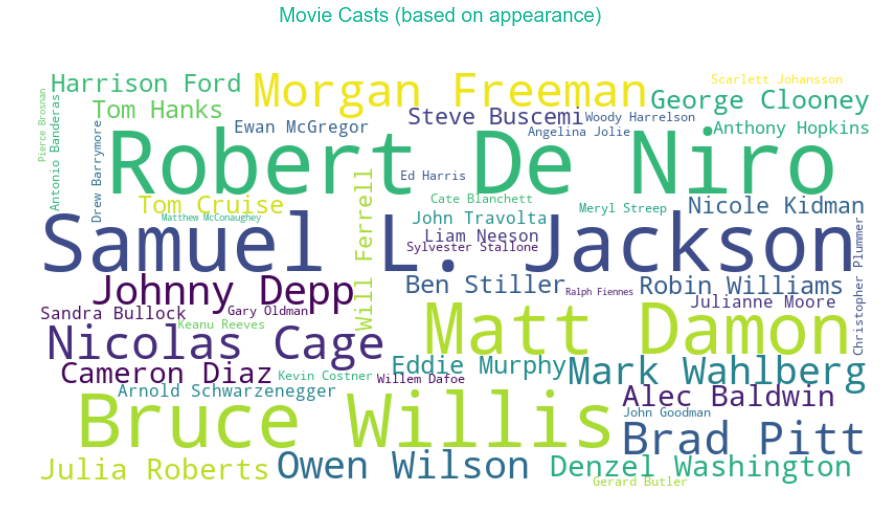

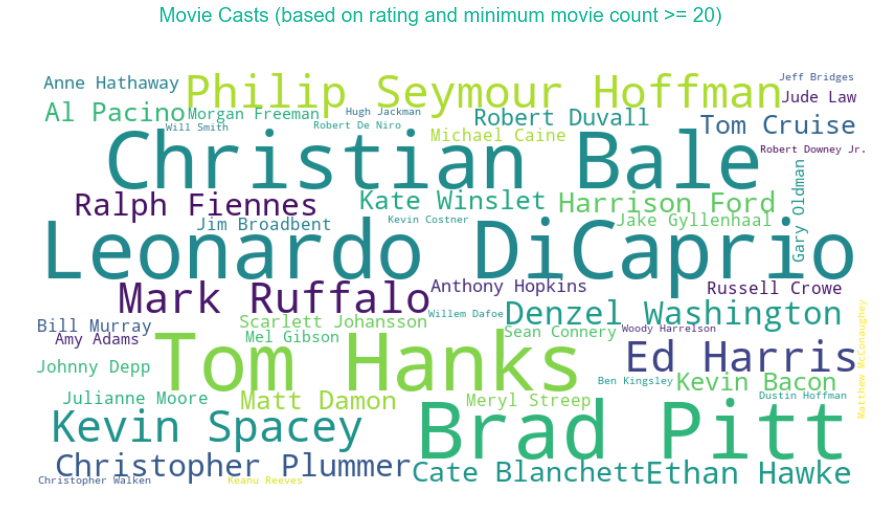

In [24]:
# WordCloud for Top 50 casts (based on appearance)
text = df_movie_cast.groupby(['name'])['id'].count().to_frame().to_dict().get('id')
fig = plt.figure(figsize=(15,8))
fig.suptitle('Movie Casts (based on appearance)', fontsize=20, color='#1ABC9C')
wc = WordCloud(width=800, height=400, background_color="white", max_words=50)
# generate word cloud
wc.generate_from_frequencies(text)

# show
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

# WordCloud for Top 50 casts (based on average rating)
# Average Rating by Movie Cast
df_movie_cast['id'] = df_movie_cast['id'].astype(int)
df = pd.merge(df_movie_cast, movies, left_on='id', right_on='id', how='left')[['id', 'name', 'vote_average']]
df = df.groupby(['name']).agg({'vote_average': 'mean', 'id': 'count'})
df['name'] = df.index
df.columns = ['vote_average', 'count', 'name']
df = df[df['count'] >= 20]
df['vote_average'] = df['vote_average']*100
text = df[['name', 'vote_average']].to_dict().get('vote_average')

fig = plt.figure(figsize=(15,8))
fig.suptitle('Movie Casts (based on rating and minimum movie count >= 20)', fontsize=20, color='#1ABC9C')
wc = WordCloud(width=800, height=400, background_color="white", max_words=50)
# generate word cloud
wc.generate_from_frequencies(text)

# show
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

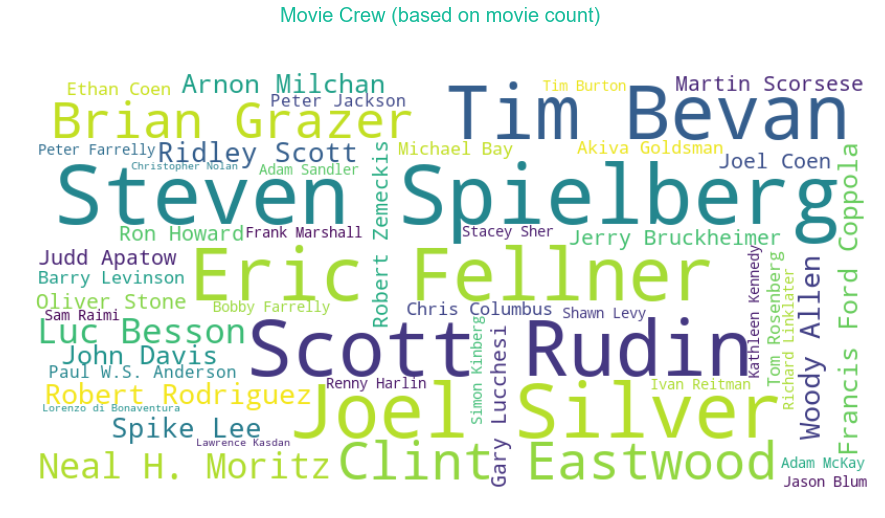

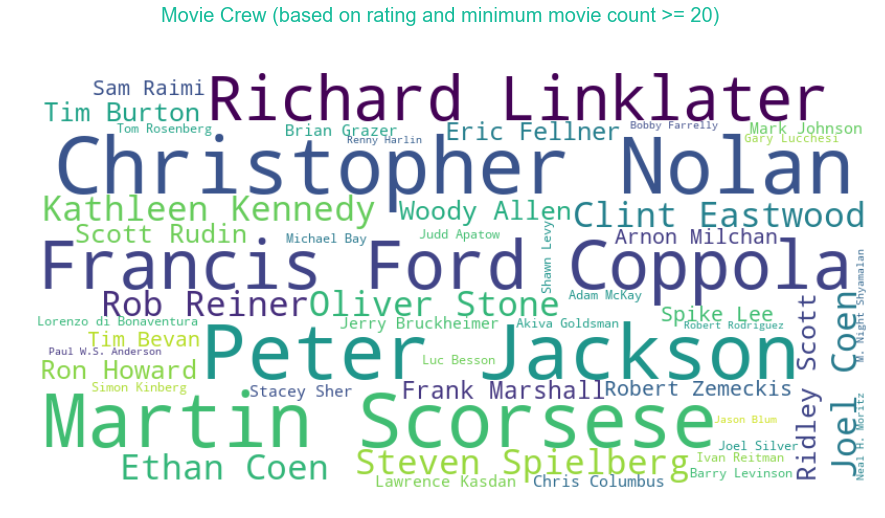

In [25]:
# WordCloud for Top 50 crew members (based on appearance)
text = df_movie_crew.groupby(['name'])['id'].count().to_frame().to_dict().get('id')
fig = plt.figure(figsize=(15,8))
fig.suptitle('Movie Crew (based on movie count)', fontsize=20, color='#1ABC9C')
wc = WordCloud(width=800, height=400, background_color="white", max_words=50)
# generate word cloud
wc.generate_from_frequencies(text)

# show
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

# WordCloud for Top 50 Crew member (based on average rating)
# Average Rating by Movie Crew
df_movie_crew['id'] = df_movie_crew['id'].astype(int)
df = pd.merge(df_movie_crew, movies, left_on='id', right_on='id', how='left')[['id', 'name', 'vote_average']]
df = df.groupby(['name']).agg({'vote_average': 'mean', 'id': 'count'})
df['name'] = df.index
df.columns = ['vote_average', 'count', 'name']
df = df[df['count'] >= 20]
df['vote_average'] = df['vote_average']*100
text = df[['name', 'vote_average']].to_dict().get('vote_average')

fig = plt.figure(figsize=(15,8))
fig.suptitle('Movie Crew (based on rating and minimum movie count >= 20)', fontsize=20, color='#1ABC9C')
wc = WordCloud(width=800, height=400, background_color="white", max_words=50)
# generate word cloud
wc.generate_from_frequencies(text)

# show
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

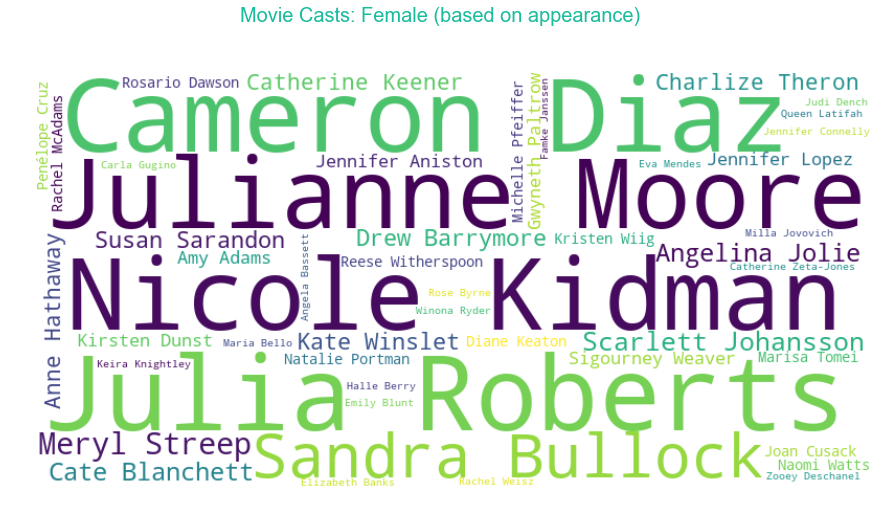

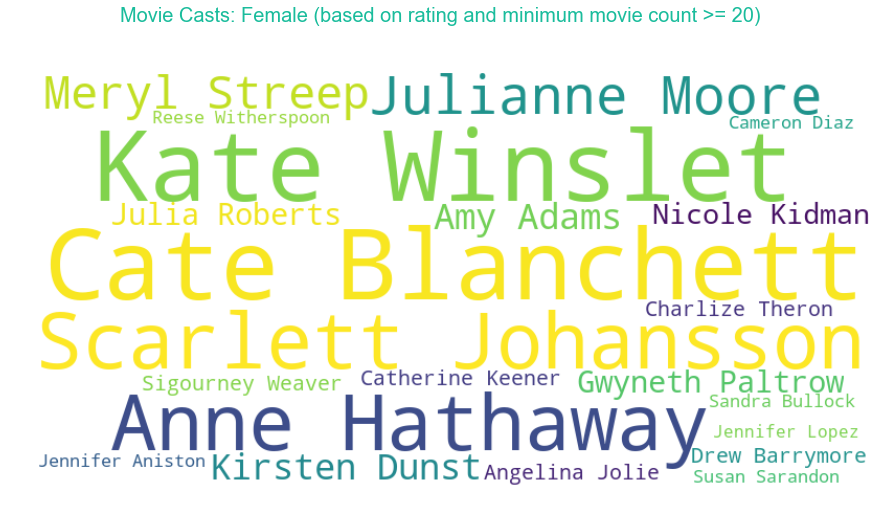

In [26]:
# WordCloud for Top 50 Female casts (based on appearance)
text = df_movie_cast[df_movie_cast['gender'] == 1].groupby(['name'])['id'].count().to_frame().to_dict().get('id')
fig = plt.figure(figsize=(15,8))
fig.suptitle('Movie Casts: Female (based on appearance)', fontsize=20, color='#1ABC9C')
wc = WordCloud(width=800, height=400, background_color="white", max_words=50)
# generate word cloud
wc.generate_from_frequencies(text)

# show
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

# WordCloud for Top 50 Female casts (based on average rating)
# Average Rating by Movie Cast
df_movie_cast['id'] = df_movie_cast['id'].astype(int)
df = pd.merge(df_movie_cast[df_movie_cast['gender'] == 1], movies, left_on='id', right_on='id', how='left')[['id', 'name', 'vote_average']]
df = df.groupby(['name']).agg({'vote_average': 'mean', 'id': 'count'})
df['name'] = df.index
df.columns = ['vote_average', 'count', 'name']
df = df[df['count'] >= 20]
df['vote_average'] = df['vote_average']*100
text = df[['name', 'vote_average']].to_dict().get('vote_average')

fig = plt.figure(figsize=(15,8))
fig.suptitle('Movie Casts: Female (based on rating and minimum movie count >= 20)', fontsize=20, color='#1ABC9C')
wc = WordCloud(width=800, height=400, background_color="white", max_words=50)
# generate word cloud
wc.generate_from_frequencies(text)

# show
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

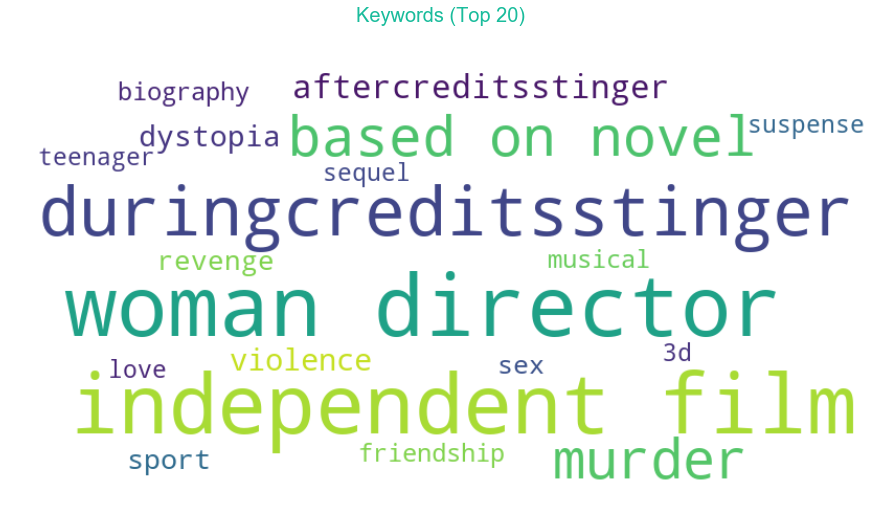

In [27]:
frequencyDict = {}
def getFrequencyDictForKeywords(keywords):
    # making dict for counting frequencies
    for text in keywords.split("|"):
        text = text.strip()
        val = frequencyDict.get(text, 0)
        frequencyDict[text.lower()] = val + 1

movies['keywords'].apply(getFrequencyDictForKeywords)

fig = plt.figure(figsize=(15,8))
fig.suptitle('Keywords (Top 20)', fontsize=20, color='#1ABC9C')
wc = WordCloud(width=800, height=400, background_color="white", max_words=20)
# generate word cloud
wc.generate_from_frequencies(frequencyDict)

# show
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

#### Recommender System

Recommender Systems be designed in two ways: through <b>Collaborative Filtering</b> or through <b>Content-based Filtering</b>. For the implementation by collaborative filtering, user's past behaviour as well as the previous decisions made by other users need to be known. Content-based Filtering approach uses the characteristics of items to derive the recommendations. Content-based Filtering system is limited in scope as it only depends on the original seed (the item whose similar item is to be recommended).

Collaborative filtering is based on the assumption that people who agreed in the past will agree in the future, and that they will like similar kinds of items as they liked in the past. It mainly suffers from three problems: <b>Cold-start</b> (as it requires a large ampount of user information to make accurate recommendations), <b>Scalability</b> (there can be million of users and products and hence a large amount of computational power is needed) and <b>Sparsity</b> (due to huge difference between number of items used and rated).

Content-based recommender system mainly rely on the features of the items and compare them for the recommendation. To abstract the features of the items in the system, an item presentation algorithm is applied. A widely used algorithm is the <b>tf–idf representation (also called vector space representation)</b>. To furtehr enhance the performance of the recommender system, a user profile can be created and used. Content-based user profile can be created by using the weighted vector of item features. Weights denote the importance of each feature to the user and can be computed from the interaction of user with the recommender system (the items that user has rated). A simple approach is to use the average values of the rated item vector. Other sophisticated machine learning techniques can be used as well.

Recommender Systems can be designed using various techniques. Hybrid of Collaborative and Content-based methods can be used. Various Hybridization techniques are: Weighted, Switching, Mixed and Cascade etc. The prime concern of the design of recommender system is accuracy but certain other factors are also important. <b>Diversity</b> is an important factor for the recommender system. Users tend to be more satisfied with recommendations when there is a higher intra-list diversity, e.g. items from different artists. <b>Serendipity</b> is the measure of how surprising the recommendations are. Though, a higher Serendipity score results in lower accuracy.

For the dataset, as user data is unavailable, we need to explore the various techniques for the implementation of Content-based Recommender System.

First of all we need to extract features for the implementation. <b>Keywords</b> can serve as an important feature. <b>TFIDF (term frequency–inverse document frequency)</b> can be used for finding the importance of a keyword. The number of times a term occurs in a document is called <b>term-frequency</b>. The weight of a term that occurs in a document is proportional to the term frequency. There can be certain terms that occur more frequently in documents and hence can decrease the weight of the terms that occur rarely. <b>Inverse Document Frequency</b>, which takes into account the number of documents in which the term appears, quantifies the Specificity of rarely occurring terms.

Simple implementation of TFIDF is as follows:

In [28]:
%%latex
\begin{equation}
tf(t, d) = \dfrac{f_t}{number\ of\ words\ in\ d}
\end{equation}

\begin{equation}
idf(t, D) = \dfrac{N}{number\ of\ documents\ in\ which\ t\ appears}
\end{equation}

\begin{equation}
tfidf(t, d, D) = tf(t, d) . idf(t, D)
\end{equation}

<IPython.core.display.Latex object>

In [29]:
from sklearn.feature_extraction.text import TfidfVectorizer
# Preprocess keywords
def preProcessKeywords(keyword):
    keyword = keyword.replace(" ", "_")
    keyword = keyword.replace("|", " ")
    return keyword
    
movies['keywords'] = movies['keywords'].apply(preProcessKeywords)

In [30]:
v = TfidfVectorizer()
x = v.fit_transform(movies['keywords'])
keywords = v.get_feature_names()

In [31]:
def postProcessKeywords(keyword):
    keyword = keyword.replace("_", " ")
    return keyword.strip()
keywords = list(map(postProcessKeywords, keywords))

Above code implements TFIDF for the keywords. A list of keywords with their corresponding score for each movie is saved which will be further used. From the movie cast, top 5 casts (in their order of appearance) are extracted and added as columns to the dataframe. A column for each genre is added as well and filled with 1 or 0 based on whether the movie belongs to the particular genre or not. From the crew info, Director is extracted and a column with name director contains the entry.

In [32]:
# Extract top 5 cast as columns
df = movies.copy()
df_movie_cast =  df_movie_cast[~df_movie_cast.duplicated(['id', 'order'], keep='first')] 
df = pd.merge(df, df_movie_cast[df_movie_cast['order'] == 0], on='id', how='left').drop(['character', 'gender', 'order'], axis=1).rename(columns={'name':'actor_0'})
df = pd.merge(df, df_movie_cast[df_movie_cast['order'] == 1], on='id', how='left').drop(['character', 'gender', 'order'], axis=1).rename(columns={'name':'actor_1'})
df = pd.merge(df, df_movie_cast[df_movie_cast['order'] == 2], on='id', how='left').drop(['character', 'gender', 'order'], axis=1).rename(columns={'name':'actor_2'})
df = pd.merge(df, df_movie_cast[df_movie_cast['order'] == 3], on='id', how='left').drop(['character', 'gender', 'order'], axis=1).rename(columns={'name':'actor_3'})
df = pd.merge(df, df_movie_cast[df_movie_cast['order'] == 4], on='id', how='left').drop(['character', 'gender', 'order'], axis=1).rename(columns={'name':'actor_4'})

In [33]:
# Make all the genres columns and popualate them with vlues 0 and 1 for corresponding movies
df_movie_genres['genre_id'] = df_movie_genres['genre_id'].astype(int)
temp = pd.merge(df_movie_genres, df_genres, left_on='genre_id', right_on='id').drop(['id_y', 'genre_id'], axis=1).rename(columns={'id_x':'id'})
temp['temp'] = 1
temp = temp.pivot(index='id', columns='name', values='temp')
temp = temp.fillna(0)
temp['id'] = temp.index

df = pd.merge(df, temp, on='id', how='left')

/Users/amitrajan/Desktop/PythonVirtualEnv/Python3_VirtualEnv/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2910: FutureWarning:

'id' is both an index level and a column label.
Defaulting to column, but this will raise an ambiguity error in a future version



In [34]:
# Fill missing values for genre columns with 0 and convert them to int
l = df_genres['name'].tolist()
df[l] = df[l].fillna(0)
df[l] = df[l].astype(int)

In [ ]:
# Extract Director and make it as column
# Need to take only one value as certain movies has more than one directors
df_movie_crew =  df_movie_crew[~df_movie_crew.duplicated(['id', 'job'], keep='first')] 
df_movie_crew[df_movie_crew['id'] == 5]
df = pd.merge(df, df_movie_crew[df_movie_crew['job']=='Director'], on='id', how='left').drop(['job', 'gender'], axis=1).rename(columns={'name':'Director'})

Movies are clustered (200 clusters) based on the TFIDF scores of keywords. Though almost 75% of the movies fall in the same cluster, but for the clusters that have lower number of movies, the recommendation based on the clustering works well. For example, the movies that are assigned to cluster number 15 (shown below) are bollywood movies and recommending them together should be the preference. The idea is to use this information while building the recommendation engine. As count of movies in a cluster affects the accuracy of recommendation based on keyword clustering, each cluster is assigned a weight which is equal to (Total Movie Count - Movie in the Cluster) / (Total Movie Count) or It would be more appropriate to assign a weight of 0 to the cluster with the heighest movie count and 1 to the rest of the clusters.

In [ ]:
# Make a dataframe of keywords and their TFIDF scores and later on cluster the movies based on keyword
keys = pd.DataFrame(data=x.todense(), columns=keywords)
from sklearn.cluster import KMeans
km = KMeans(n_clusters=200, init='k-means++', max_iter=500, n_init=5)
km.fit(keys)
df['keyword_cluster'] = km.labels_

In [ ]:
df[df['keyword_cluster'].isin([15])]

In [ ]:
s = df.groupby(df['keyword_cluster'])['id'].count()
print("The cluster number with assigned weight 0 is : " + str(s.idxmax(axis=0)))

In [ ]:
# Helper Fucnctions to plot graphs and tables
def showResultsInTabularForm(test_data, result):
    columns = ['id', 'title', 'Director', 'Cast', 'total_score', 'vote_average', 'popularity']
    cast = result['actor_0'] + ',' + result['actor_1'] + ',' + result['actor_2'] + ',' + result['actor_3'] + ',' + result['actor_4']
    layout = go.Layout(
        title='Suggestions for: ' + test_data['title'])
    trace = go.Table(
    columnwidth = [40, 80, 80, 200, 40, 40, 40],
    header=dict(values=columns,
                fill = dict(color='#C2D4FF'),
                align = ['center']),
    cells=dict(values=[result['id'], result['title'], result['Director'], cast ,
                       result['total_score'], result['vote_average'], result['popularity']],
               fill = dict(color='#F5F8FF'),
               align = ['center']))
    data = [trace]
    fig = go.Figure(data=data, layout=layout)
    plotly.offline.iplot(fig, filename = 'pandas_table')
    
import networkx as nx
def showResultsInGraphicalForm(test_data, result):
    fig = plt.figure(figsize=(30,16))
    fig.suptitle('Suggestions for: ' + test_data['title'], fontsize=30, color='#99A3A4')
    G = nx.Graph()
    l = []
    for index, row in result.iterrows():
        l.append((test_data['title'], row['title'], {'weight':row['total_score']}))
    G.add_edges_from(l)
    # Edge weight and color
    elarge=[(u,v) for (u,v,d) in G.edges(data=True) if d['weight'] > result['total_score'].quantile(0.8)]
    esmall=[(u,v) for (u,v,d) in G.edges(data=True) if d['weight'] <= result['total_score'].quantile(0.8)]
    pos = nx.spring_layout(G) # positions for all nodes
    nx.draw_networkx_nodes(G, pos, node_size=1000, node_color='#AED6F1', alpha=0.6)
    nx.draw_networkx_edges(G, pos, edgelist=elarge, width=3)
    nx.draw_networkx_edges(G, pos, edgelist=esmall, width=3, alpha=0.5, edge_color='r', style='dashed')
    nx.draw_networkx_labels(G, pos, font_size=25, font_family='sans-serif')
    plt.axis('off')
    plt.show() # display

##### 1. Recommender System based on Vector Space Model

Vector Space Model which uses the proximity between vectors based on angle between them can be used to implememt content-based recommendation system. Angles between the vectors can be computed by implementing Cosine Similarity measure. A recommender System based on Vector Space Model which computes the similarity between TF-IDF scores for keywords is implemented below.

The recommender system does a decent job in recommending movies although we haven't taken into consideration the genres, actors and director which can play an important role in providing more relevant recommendation.

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
similarity_matrix = pd.DataFrame(cosine_similarity(keys), columns=keys.index)

def VSMbasedRecommendationEngine(movie_index):
    s = similarity_matrix.sort_values(by=[movie_index], ascending=False)[movie_index].head(26).tail(25)
    # Return data in appropriate format (Same format as the below recommendation engine)
    res = movies.iloc[s.index, :]
    res['total_score'] = s
    return res

In [ ]:
df_test = df.sample(n=1)
# df_test = df[df.index == 18]
for index, row in df_test.iterrows():
    result = VSMbasedRecommendationEngine(index)
    # showResultsInTabularForm(row, result)
    showResultsInGraphicalForm(row, result)

##### 2. Correlation based Recommender System

The idea is to use the key fields and assign them a weight (based on the domain knowledge) and find the correlation between the movie for which we have to recommend and the rest of the movies. The fields that will be used are genres, Director, Actors and Keywords. original_language is used to filter the movies for recommendation. Popularity and vote_average will be used to give priority to the recommendations. The weights for the corresponding fields are as follows:

In [ ]:
weights = {'genres' : 0.3,
          'director' : 0.25,
          'actors' : 0.25,
          'Keywords' : 0.2}
weights

The correlation based recommendation system which takes into account language, genres, actors and director along with keywords shows more relevent recommendation as compared to the one which takes only keywords into account.

In [ ]:
df = df.drop(['genres', 'budget', 'homepage', 'keywords', 'overview', 'production_companies', 'production_countries', 
              'release_date', 'revenue', 'runtime', 'spoken_languages', 'status', 'tagline', 'vote_count', 
              'release_year', 'release_month', 'release_day',], axis=1)

In [ ]:
def correlationBasedRecommendationEngine(df, movie_id, weights, genres):
    # Find the cluster with the most number of movies
    ignore_cluster = df.groupby(df['keyword_cluster'])['id'].count().idxmax(axis=0)
    
    # Make a copy of dataframe to store the results (drop the row for the original movie_id)
    res = df.copy()
    res = res.drop(res[res['id'] == movie_id].index)
    
    # Drop the rows for the movies which do not have the same original_language
    original_language = df[df['id'] == movie_id]['original_language'].iloc[0] 
    res = res.drop(res[res['original_language'] != original_language].index)
    
    # Extract list of actors from the movie
    actor_columns = ['actor_0', 'actor_1', 'actor_2', 'actor_3', 'actor_4']
    df[actor_columns] = df[actor_columns].fillna("")
    actors_list = df[df['id'] == movie_id][actor_columns].values.tolist()[0]
    actors_list = [item.strip() for item in actors_list]
    
    # Calculate score based on actors
    res[actor_columns] = res[actor_columns].astype(str)
    res['actors_score'] = 0.0;
    for index, row in res.iterrows():
        l = row[actor_columns].values.tolist()
        l = [item.strip() for item in l]
        score = compare_actors(actors_list, l)
        res.at[index,'actors_score'] = score
    res['actors_score'] = res['actors_score'] * weights.get('actors')
    
    # Calculate score based on director
    director = df[df['id'] == movie_id]['Director'].iloc[0]
    res['director_score'] = (res['Director'] == director) * weights.get('director')
    
    # Calculate score based on keywords when keyword cluster does not belong to most frequent cluster
    most_freq_cluster = df.groupby(df['keyword_cluster'])['id'].count().idxmax(axis=0)
    movie_cluster = df[df['id'] == movie_id]['keyword_cluster'].iloc[0]
    res['keyword_score'] = 0.0
    if movie_cluster != most_freq_cluster:
        res['keyword_score'] = (res['keyword_cluster'] == movie_cluster) * weights.get('Keywords')
    
    # Calculate score based on genres
    v = np.array(df[df['id'] == movie_id][genres].iloc[0].tolist())
    res['genre_score'] = (res[genres].dot(v) / v.size) * weights.get('genres')
    
    # Total score
    res['total_score'] = res[['actors_score', 'director_score', 'keyword_score', 'genre_score']].sum(axis=1)
    return res.sort_values(by=['total_score', 'vote_average', 'popularity'], ascending=False).head(25)
    
def compare_actors(actors1, actors2):
    return len(set(actors1) & set(actors2)) / len(actors1)

In [ ]:
df_test = df.sample(n=1)
# df_test = df[df.index == 18]
for index, row in df_test.iterrows():
    result = correlationBasedRecommendationEngine(df, row['id'], weights, df_genres['name'].tolist()).head(25)
    # showResultsInTabularForm(row, result)
    showResultsInGraphicalForm(row, result)

#### Comparison of Results

It is evident that the correlation based recommendation system has a quite improved performance when compared to the first one. Movies recommended by it have a decent match when compared to the ones which are suggested by Google's People also search for. With the amount of data available and the lack of the knowledge about the specific taste of individual users, the implemented recommendation system does a pretty decent job.

In [ ]:
df_test = df.sample(n=1)
# df_test = df[df.index == 18]
for index, row in df_test.iterrows():
    result1 = correlationBasedRecommendationEngine(df, row['id'], weights, df_genres['name'].tolist()).head(25)
    result2 = VSMbasedRecommendationEngine(index)
    # showResultsInTabularForm(row, result)
    showResultsInGraphicalForm(row, result1)
    showResultsInGraphicalForm(row, result2)